# Проект 6: Рекомендательные системы

## Project goal

Создать рекомендательную систему для компании, занимающейся онлайн-ритейлом (розничными продажами в интернете), 
с целью увеличения среднего чека продаж. Система должна рекомендовать нужные пользователю товары с более высоким средним чеком.
В данном проекте мы рассмотрим основные этапы создания рекомендательной системы интернет-магазина.

В ходе работы над проектом решаются следующие задачи: 
1. Провести EDA - разведовательный анализ данных
2. Выполнить предобработка данных и генерацию новых признаков
3. Обучение Baseline модели c помощью LightFM
4. Решение проблемы холодного старта путём добавления item_features и user_features
5. Реализация рекомендательной системы с помощью бибилиотеки fast.ai:
6. Создание прототипа

**Dataset:**  
Имеется история оценок пользователя вместе с его обзором. Все оценки пользователей нормированы для бинарной классификации, если человек поставил оценку продукту больше 3 (не включительно), то считается, что продукт ему понравился, если меньше 4, то продукт не понравился.
  
test.csv - набор данных, для которого вы должны сделать предсказания. У каждого наобора userid, itemid есть свой id, для которого вы должны сделать предсказание.  
  
overall - рейтинг, который поставил пользователь  
verified - был ли отзыв верифицирован  
reviewTime - когда был отзыв написан  
reviewerName - имя пользователя  
reviewText - текст отзыва  
summary - сжатый отзыв  
vote - количество голосований за отзыв  
style - метаданные  
image - изображение продукта  
userid - id пользователя  
itemid - id товара  
id - id для предсказания  

**Метрики:**   
 в качестве метрики для оценки рекомендаций используется RocAuc.

## Install libraries

In [1]:
#pip install pandas_profiling
#pip install ipywidgets


## Import libraries

In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import pandas_profiling

import scipy.sparse as sparse
from sklearn import preprocessing
from lightfm import LightFM
from lightfm.cross_validation import random_train_test_split
from lightfm.evaluation import auc_score, precision_at_k, recall_at_k
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler
from sklearn.metrics import auc, roc_auc_score, roc_curve
import matplotlib.pyplot as plt

import json
import time
import datetime
import re

%matplotlib inline

C:\Users\Alexey\anaconda3\envs\skillfactory\lib\site-packages\lightfm\_lightfm_fast.py:10: UserWarning: LightFM was compiled without OpenMP support. Only a single thread will be used.
  "LightFM was compiled without OpenMP support. "


## Helper's class 

In [3]:
# EDA class provides a list of methods for EDA analysis
class EDA():

    def __init__(self, data, description):
        self.data = data  # data for analysis
        self.description = description  # brief data description

    # provide info about data
    def basic_info(self):
        self.display("Preview")
        display(self.data.sample(3))  # data preview

        self.display("Info")
        self.data.info()  # data info

        print('\n')
        print('Shape: {}'.format(self.data.shape))

        for column in self.data.columns:
            self.null_values_info(column)

    # do primary data analysis
    def primary_analysis(self):
        display(pandas_profiling.ProfileReport(self.data))

    # column info
    def column_info(self, column):
        print('Количество пропусков: {},'.format(self.data[column].isnull().sum()))
        print('{},'.format(self.data[column].describe()))
        print('Распределение:\n{},'.format(self.data[column].value_counts()))
    
    # column info with histogram
    def column_info_hist(self, column):
        self.column_info(column)
        self.data[column].hist()
    
    # get info about column with null values
    def null_info(self, column):
        display(self.data[column].value_counts(dropna=False))
        mode = self.data[column].mode()[0]
        print('{} mode is \033[1m{}\033[0m'.format(column, mode))

    # get percent of null values in column
    def null_values_info(self, column):
        nanPercent = len(self.data[self.data[column].isnull()])/len(self.data)
        print('Percent nullable records in \033[1m{}\033[0m column: {:2.1%}'.format(
            column, nanPercent))
        return nanPercent

    # get outliers info
    def outlier_info(self, column):
        IQR = self.data[column].quantile(
            0.75) - self.data[column].quantile(0.25)
        perc25 = self.data[column].quantile(0.25)
        perc75 = self.data[column].quantile(0.75)

        ds = self.data.loc[self.data[column].between(
            perc25 - 1.5*IQR, perc75 + 1.5*IQR)]
        totalCount = len(self.data)
        outlierCount = totalCount - len(ds)

        print('\033[1mCOLUMN: {} \033[0m'.format(column))
        print('25%: {}.'.format(perc25))
        print('75%: {}.'.format(perc75))
        print('IQR: {}.'.format(IQR))
        print('Outlier ranges: [{f}, {l}].'.format(
            f=perc25 - 1.5*IQR, l=perc75 + 1.5*IQR))
        print('\033[1mOutlier count: {} from {} ({:.0%}).\033[0m'.format(
            outlierCount, totalCount, outlierCount/totalCount))
        print('\n')

    # do variance analysis for numeric variables
    def numeric_variance_analysis(self, columns):
        imp_num = pd.Series(
            f_classif(self.data[columns], self.data['default'])[0], index=columns)
        imp_num.sort_values(inplace=True)
        imp_num.plot(kind='barh', color='turquoise')

    # do variance analysis for string variables
    def variance_analysis(self, columns):
        imp_num = pd.Series(mutual_info_classif(self.data[columns], self.data['default'],
                                                discrete_features=True), index=columns)
        imp_num.sort_values(inplace=True)
        imp_num.plot(kind='barh', color='turquoise')

    # Student test
    def get_stat_dif(self, columns):
        for column in columns:
            cols = self.data.loc[:, column].value_counts().index[:10]
            combinations_all = list(combinations(cols, 2))

            if len(combinations_all) == 0:
                break

            for comb in combinations_all:
                if ttest_ind(self.data.loc[df.loc[:, column] == comb[0], 'default'],
                             self.data.loc[df.loc[:, column] == comb[1], 'default']). pvalue\
                        <= 0.1/len(combinations_all):
                    print('Exist stat significant differences for column ', column)
                    break

    # print text
    def display(self, text):
        print('\033[1m--- {}: {} ---\033[0m'.format(self.description.upper(), text))

## Helpers functions

In [4]:
def roc_auc_curve(y_true, y_pred_prob):
    fpr, tpr, _ = roc_curve(y_true, y_pred_prob)
    plt.figure()
    plt.plot([0, 1], label='Случайный классификатор', linestyle='--')
    plt.plot(fpr, tpr, label = 'LightFM')
    plt.title('ROC AUC = %0.3f' % roc_auc_score(y_true, y_pred_prob))
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.legend(loc = 'lower right')
    plt.show()

## Load data

In [5]:
# Загрузка Train, Test, Submission dataset
train = pd.read_csv('kaggle/input/recommendationsv4/train.csv', low_memory=False)
test = pd.read_csv('kaggle/input/recommendationsv4/test.csv', low_memory=False)
submission = pd.read_csv('kaggle/input/recommendationsv4/sample_submission.csv', low_memory=False)

In [6]:
# Загрузка json с метаданными, которые потенциально расширить данные для учучшения результатов модели
with open('kaggle/input/recommendationsv4/meta_Grocery_and_Gourmet_Food.json') as f:
    meta_list = []
    for line in f.readlines():
        meta_list.append(json.loads(line))
        
meta = pd.DataFrame(meta_list)

## 1. Data: Basic info

In [7]:
eda_train = EDA(train, 'train data')
eda_train.basic_info()

--- TRAIN DATA: Preview ---


,overall,verified,reviewTime,asin,reviewerName,reviewText,summary,unixReviewTime,vote,style,image,userid,itemid,rating
659232,5.0,True,"06 3, 2014",B000E1HUVC,P. Myers,These were very good and fresh tasting. Not to...,Nuts,1401753600,NaN,"{'Size:': ' 14.5 Ounce (Pack of 1)', 'Flavor:'...",NaN,23044,1387,1.0
254416,5.0,True,"07 26, 2016",B00V4C6FMK,MASmith,Great product.,little goes a long way.,1469491200,NaN,{'Size:': ' 1 Pack'},NaN,16086,33211,1.0
408024,5.0,False,"09 3, 2010",B002ZOG2K6,Darian P. Paganelli,Why buy this coffee on line. Pick it up at BJ'...,less expensive in warehouse club stores,1283472000,2,NaN,NaN,51144,11204,1.0


--- TRAIN DATA: Info ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 857895 entries, 0 to 857894
Data columns (total 14 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   overall         857895 non-null  float64
 1   verified        857895 non-null  bool   
 2   reviewTime      857895 non-null  object 
 3   asin            857895 non-null  object 
 4   reviewerName    857719 non-null  object 
 5   reviewText      857616 non-null  object 
 6   summary         857725 non-null  object 
 7   unixReviewTime  857895 non-null  int64  
 8   vote            118740 non-null  object 
 9   style           444406 non-null  object 
 10  image           7142 non-null    object 
 11  userid          857895 non-null  int64  
 12  itemid          857895 non-null  int64  
 13  rating          857895 non-null  float64
dtypes: bool(1), float64(2), int64(3), object(8)
memory usage: 85.9+ MB


Shape: (857895, 14)
Percent nullable records in overal

In [8]:
eda_test = EDA(test, 'test data')
eda_test.basic_info()

--- TEST DATA: Preview ---


,verified,reviewTime,asin,reviewerName,unixReviewTime,vote,style,image,userid,itemid,Id
195467,True,"07 26, 2015",B00I1MSMQS,doggies5,1437868800,NaN,{'Size:': ' 22 Count'},NaN,122640,27241,195467
180891,True,"02 15, 2015",B002XS6LOG,Kindle Customer,1423958400,NaN,{'Size:': ' 6 oz.'},NaN,87331,11170,180891
82881,True,"05 23, 2017",B001XUO8AY,shack,1495497600,NaN,"{'Size:': ' 6.8 Ounce (Pack of 24)', 'Flavor:'...",NaN,82939,9936,82881


--- TEST DATA: Info ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 285965 entries, 0 to 285964
Data columns (total 11 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   verified        285965 non-null  bool  
 1   reviewTime      285965 non-null  object
 2   asin            285965 non-null  object
 3   reviewerName    285918 non-null  object
 4   unixReviewTime  285965 non-null  int64 
 5   vote            39462 non-null   object
 6   style           147680 non-null  object
 7   image           2368 non-null    object
 8   userid          285965 non-null  int64 
 9   itemid          285965 non-null  int64 
 10  Id              285965 non-null  int64 
dtypes: bool(1), int64(4), object(6)
memory usage: 22.1+ MB


Shape: (285965, 11)
Percent nullable records in verified column: 0.0%
Percent nullable records in reviewTime column: 0.0%
Percent nullable records in asin column: 0.0%
Percent nullable records in reviewerName column: 0

In [9]:
eda_meta = EDA(meta, 'meta data')
eda_meta.basic_info()

--- META DATA: Preview ---


,category,description,title,brand,rank,also_view,main_cat,price,asin,also_buy,image,date,feature,details,similar_item,tech1,fit
86126,"[Grocery & Gourmet Food, Beverages, Coffee, Te...",[Nothing says Christmas like a traditionally d...,Coffee Masters Perfect Potful Gingerbread Spic...,Coffee Masters,"646,513inGroceryGourmetFood(",NaN,Grocery,NaN,B0056GL336,NaN,[https://images-na.ssl-images-amazon.com/image...,NaN,NaN,"\n <div class=""content"">\n\n\n\n\n\n\n<ul...",NaN,NaN,NaN
274005,"[Grocery & Gourmet Food, Condiments & Salad Dr...",[Italian Dressing with Olive Oil - Enjoy the z...,"Kraft Olive Oil Vinaigrettes Italian Dressing,...",Kraft Brand Dressing,NaN,"[B000PYCI8S, B01N4V8ST6, B000E1DSTU, B000SQQQN...",Grocery,NaN,B01BWMGM24,NaN,[https://images-na.ssl-images-amazon.com/image...,NaN,NaN,"\n\n\n\n\n\n <div class=""disclaim"">Flavor: ...",NaN,NaN,NaN
24083,"[Grocery & Gourmet Food, Beverages, Bottled Be...",[V8 was born out of the idea that great taste ...,"V8 Original 100% Vegetable Juice, 11.5 oz. Can...",V8,NaN,"[B00LM3G7IS, B0010XXROM, B000OUYNB8, B073H3DW2...",Grocery,NaN,B000R30LB8,"[B000OV0SDE, B000T9WLTK, B01IQRAWCE, B000WLAVV...",[https://images-na.ssl-images-amazon.com/image...,NaN,NaN,"\n <div class=""content"">\n\n\n\n\n\n\n<ul...",NaN,NaN,NaN


--- META DATA: Info ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 287209 entries, 0 to 287208
Data columns (total 17 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   category      287209 non-null  object
 1   description   251802 non-null  object
 2   title         287205 non-null  object
 3   brand         275787 non-null  object
 4   rank          275494 non-null  object
 5   also_view     121012 non-null  object
 6   main_cat      285716 non-null  object
 7   price         132136 non-null  object
 8   asin          287209 non-null  object
 9   also_buy      83332 non-null   object
 10  image         150214 non-null  object
 11  date          9663 non-null    object
 12  feature       16374 non-null   object
 13  details       273323 non-null  object
 14  similar_item  256 non-null     object
 15  tech1         744 non-null     object
 16  fit           4 non-null       object
dtypes: object(17)
memory usage: 37.3+ MB


Shap

In [10]:
print('Размер TRAIN:',train.shape)
print('Размер TEST:',test.shape)
print("Размер meta-file:",meta.shape)
print('Размер Submission file:',submission.shape)

Размер TRAIN: (857895, 14)
Размер TEST: (285965, 11)
Размер meta-file: (287209, 17)
Размер Submission file: (285965, 2)


In [11]:
print("Количество уникальных товаров в Train",len(train.asin.unique()))
print("Количество уникальных товаров в Test",len(test.asin.unique()))

Количество уникальных товаров в Train 41302
Количество уникальных товаров в Test 37876


#### Basic info: Summary
1. Структура **Test** и **Train** datasets в целом идентична, за исключением того что только в **Train** dataset присутствуют колонки **overall**, **reviewText**, **summary**, **rating**. Колонка **Id** присутствует только в  **Test** dataset.
2. **Test** и **Train** datasets содержат **Null** значения в колонках **vote**, **style**, **image**
3. Колонка **asin** (Amazon Standard Identification Number товара) может использоваться для связи **Meta** dataset с  **Test** и **Train** datasets

## 2. Baseline model 

In [12]:
NUM_THREADS = 4 #число потоков
NUM_COMPONENTS = 30 #число параметров вектора 
NUM_EPOCHS = 20  #число эпох обучения
RANDOM_STATE = 32

In [13]:
train_data, test_data = train_test_split(train,random_state=RANDOM_STATE, shuffle=True)

In [14]:
ratings_coo = sparse.coo_matrix((train_data['rating'].astype(int),
                                 (train_data['userid'],
                                  train_data['itemid'])))

In [15]:
model = LightFM(learning_rate=0.1, loss='logistic', no_components=NUM_COMPONENTS, random_state=RANDOM_STATE)
model = model.fit(ratings_coo, epochs=NUM_EPOCHS, num_threads=NUM_THREADS)

In [16]:
#Получаем предсказание:
preds = model.predict(test_data.userid.values, test_data.itemid.values)

In [17]:
# Подсчитываем метрику roc_auc_score
sklearn.metrics.roc_auc_score(test_data.rating,preds)

0.7455217985686625

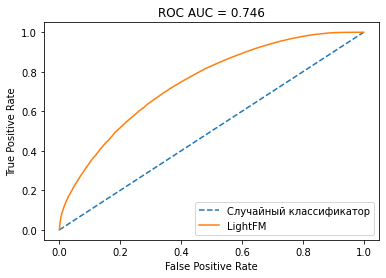

In [18]:
#Cтроим ROC AUС
roc_auc_curve(test_data.rating,preds)

In [19]:
normalized_preds = (preds - preds.min())/(preds - preds.min()).max()

In [20]:
preds.min(), preds.max(), normalized_preds.min(), normalized_preds.max()

(-24.996433, 29.76913, 0.0, 1.0)

**Summary:**  
На базовой модели результаты RocAuc: **0.7455**  
Попробуем более детально изучаить данные чтобы улучшить модель

## 3. EDA

На основе первичного анализа данных мы нашли отличия в **train** и **test** datasets, 
а также поняли что dataset **meta** позволяет по ASIN получить больше информации о продукте.

### 3.1 Remove duplicates

In [21]:
#remove duplicates from train dataset
train.drop_duplicates(inplace = True)
train.shape

(826895, 14)

**Summary:**   
Были удалены дубликаты, изначально было 857895 записей

In [22]:
#remove duplicates from train dataset
test.drop_duplicates(inplace = True)
test.shape

(285965, 11)

**Summary:**   
Дубликаты не обнаружено, изначально было 285965 записей

In [23]:
#count duplicates in meta dataset
len(meta) - meta.asin.nunique()

3697

**Summary:**   
Найдено 3697 дубликатов в каталоге продуктов

In [24]:
#remove duplicates from meta dataset
meta = meta[~meta.duplicated(subset=['asin'])]
meta.shape

(283512, 17)

**Summary:**   
Дубликаты удалены, изначально было 287209 записей. Удалено 3697 записей

### 3.2 Merge datasets

In [25]:
df = train.copy()
df = pd.merge(df, meta, on='asin')

In [26]:
df.sample(5)

,overall,verified,reviewTime,asin,reviewerName,reviewText,summary,unixReviewTime,vote,style,...,main_cat,price,also_buy,image_y,date,feature,details,similar_item,tech1,fit
705063,4.0,True,"06 9, 2016",B0061IUKDM,JJ0007,Very nice tea. I do wish the tea bags were a ...,"This is a very nice tea, just wish it was a bi...",1465430400,NaN,{'Flavor:': ' Ginger Ginseng - Herbal'},...,Grocery,NaN,NaN,[https://images-na.ssl-images-amazon.com/image...,NaN,NaN,"\n\n\n\n\n\n <div class=""disclaim"">Flavor: ...",NaN,NaN,NaN
587652,5.0,True,"03 30, 2017",B00C2F318O,The Dude,Highest quality lemon juice I could find on Am...,Five Stars,1490832000,NaN,NaN,...,Grocery,$47.94,"[B017AMYXEE, B01JI3361O, B001LO1BF2, B00HYJR9Y...",[https://images-na.ssl-images-amazon.com/image...,NaN,NaN,"\n <div class=""content"">\n\n\n\n\n\n\n<ul...",NaN,NaN,NaN
44325,5.0,True,"02 3, 2018",B00KSN9TME,Estela Jarman,Great!,Five Stars,1517616000,NaN,NaN,...,Grocery,$13.67,"[B003TNANSO, B003TMZQC8, B0034EDMCW, B00IZF0P9...",[https://images-na.ssl-images-amazon.com/image...,NaN,NaN,"\n\n\n\n\n\n <div class=""disclaim"">Flavor: ...",NaN,NaN,NaN
363611,5.0,True,"05 22, 2017",B000SR5TJM,Elizabeth Duckworth,The best seasoning salt for steaks ever made. ...,As good as it gets.,1495411200,NaN,NaN,...,Grocery,NaN,NaN,[https://images-na.ssl-images-amazon.com/image...,NaN,"[Made with all-natural spices, Contains no MSG...","\n <div class=""content"">\n\n\n\n\n\n\n<ul...",NaN,NaN,NaN
579612,5.0,True,"08 23, 2016",B00BPUTXGQ,Mrs Prairie Bear,1 teaspoon (the daily requirement of potassium...,Good product,1471910400,39,NaN,...,Grocery,$19.99,"[B00NPS6U76, B0753LRY65, B008HFO7U4, B0028BW0I...",[https://images-na.ssl-images-amazon.com/image...,NaN,NaN,"\n <div class=""content"">\n\n\n\n\n\n\n<ul...",NaN,NaN,NaN


In [27]:
eda = EDA(df, "data")
eda.basic_info()

--- DATA: Preview ---


,overall,verified,reviewTime,asin,reviewerName,reviewText,summary,unixReviewTime,vote,style,...,main_cat,price,also_buy,image_y,date,feature,details,similar_item,tech1,fit
615844,5.0,True,"01 2, 2018",B00OXC390Y,barry,My favorite.,Coffee,1514851200,NaN,NaN,...,Grocery,$14.99,"[B00OXC1TMO, B00VKDLLTA, B00I1MSJSY, B00I1MSMQ...",[https://images-na.ssl-images-amazon.com/image...,NaN,NaN,"\n <div class=""content"">\n\n\n\n\n\n\n<ul...",NaN,NaN,NaN
154730,3.0,True,"07 24, 2013",B001D0KG1Y,Larry Siegel,Try the other Extra Bold K-cups and compare to...,Good strong coffee,1374624000,NaN,NaN,...,Grocery,$49.90,"[B003ZIVX3M, B010BVQ8AI, B0033BHT5M, B000HZLPP...",[https://images-na.ssl-images-amazon.com/image...,NaN,NaN,"\n\n\n\n\n\n <div class=""disclaim"">Flavor: ...",NaN,NaN,NaN
721580,5.0,True,"12 1, 2013",B001VNEHA4,Adrienne Lockhart,The best price for taco seasoning and some of ...,"Tasty, amazing price, great product",1385856000,NaN,NaN,...,Grocery,$15.80,"[B001VNGLA8, B001VNEBLO, B001VNGKAO, B001VNO1N...",[https://images-na.ssl-images-amazon.com/image...,NaN,NaN,"\n <div class=""content"">\n\n\n\n\n\n\n<ul...",NaN,NaN,NaN


--- DATA: Info ---
<class 'pandas.core.frame.DataFrame'>
Int64Index: 826895 entries, 0 to 826894
Data columns (total 30 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   overall         826895 non-null  float64
 1   verified        826895 non-null  bool   
 2   reviewTime      826895 non-null  object 
 3   asin            826895 non-null  object 
 4   reviewerName    826731 non-null  object 
 5   reviewText      826621 non-null  object 
 6   summary         826729 non-null  object 
 7   unixReviewTime  826895 non-null  int64  
 8   vote            113951 non-null  object 
 9   style           428197 non-null  object 
 10  image_x         6979 non-null    object 
 11  userid          826895 non-null  int64  
 12  itemid          826895 non-null  int64  
 13  rating          826895 non-null  float64
 14  category        826895 non-null  object 
 15  description     756221 non-null  object 
 16  title           826895 non-null  obje

### 3.3 Data cleanup

In [28]:
#удалим колонки с большим количеством Null записей
df = df.drop(['date', 'feature', 'similar_item', 'tech1', 'fit'], axis=1)

In [29]:
#cоздадим колонку image, в которой будем хранить image_x если не Null или image_y
df["image"] = np.where(pd.isna(df["image_x"]), df["image_y"],df["image_x"])

In [30]:
df = df.drop(['image_x', 'image_y'], axis=1)
df.sample(3)

,overall,verified,reviewTime,asin,reviewerName,reviewText,summary,unixReviewTime,vote,style,...,description,title,brand,rank,also_view,main_cat,price,also_buy,details,image
38131,5.0,True,"02 28, 2016",B0014WYXYW,Tina Jeffrey,I'm diabetic and my endocrinologist has me dri...,Good sparkling drink,1456617600,NaN,NaN,...,[Whoever said juice cant sparkle your senses h...,"IZZE Sparkling Juice, Blackberry, 8.4 oz Cans,...",Izze,"2,385inGroceryGourmetFood(","[B078NFL21H, B003LPMC3O, B00O0X8B7W, B07CM81FP...",Grocery,$19.00,"[B0725FXFBN, B078NFL21H, B00H5QQ2AY, B003QQ4BP...","\n\n\n\n\n\n <div class=""disclaim"">Flavor: ...",[https://images-na.ssl-images-amazon.com/image...
157866,4.0,True,"02 17, 2010",B000HDOQ5U,Kathleen Engel,Perky's Crunchy Flax cereal\ncrunchy indeed an...,Gluten Free Cereal,1266364800,6,"{'Size:': ' 10 Ounce - Pack of 12', 'Flavor:':...",...,"[Can a cereal really be nutritious, sweet and ...","Enjoy Life, Perky's Crunchy Flax Cereal, Glute...",Enjoy Life Foods,"207,362inGroceryGourmetFood(","[B000E48IMO, B00CTDVJDI, B001FXPNY4, B0010C4KC...",Grocery,NaN,NaN,"\n\n\n\n\n\n <div class=""disclaim"">Flavor: ...",[https://images-na.ssl-images-amazon.com/image...
308624,1.0,True,"08 17, 2015",B00AXK9ROC,Suzanne,Tasted old and bitter,One Star,1439769600,NaN,NaN,...,[Great buttery flavor and no melting required....,"Snappy Popcorn Butter Burst Oil, 1 gallon (128...",Snappy Popcorn,"1,239inGroceryGourmetFood(",NaN,Grocery,$20.84,"[B006R9DO1U, B004W8LT10, B00819SSGK, B002YLGAF...","\n\n\n\n\n\n <div class=""disclaim"">Size: <s...",[https://images-na.ssl-images-amazon.com/image...


### 3.4 Data analysis

#### Column: verified

In [31]:
eda.column_info('verified')

Количество пропусков: 0,
count     826895
unique         2
top         True
freq      718164
Name: verified, dtype: object,
Распределение:
True     718164
False    108731
Name: verified, dtype: int64,


**Summary**  
1. Отсутствуют пропуски
2. Можно преобразовать в число
3. Бинарная колонка

In [33]:
df['verified'] = df['verified'].apply(lambda x: 1 if x == True else 0).astype('int')

#### Column: reviewTime & unixReviewTime

In [34]:
df[['reviewTime','unixReviewTime']].sample(5)

,reviewTime,unixReviewTime
308181,"03 14, 2007",1173830400
264992,"12 20, 2015",1450569600
492999,"12 11, 2016",1481414400
763289,"07 16, 2016",1468627200
611137,"11 22, 2015",1448150400


**Summary**  
1. Колонка reviewTime является текстовым представлением unixReviewTime, ее можно удалить

In [35]:
df = df.drop(['reviewTime'], axis=1)

In [36]:
pd.to_datetime(df['unixReviewTime'].min(),unit='s'), pd.to_datetime(df['unixReviewTime'].max(),unit='s')

(Timestamp('2000-08-09 00:00:00'), Timestamp('2018-10-02 00:00:00'))

Количество пропусков: 0,
count    8.268950e+05
mean     1.442305e+09
std      5.961629e+07
min      9.657792e+08
25%      1.412467e+09
50%      1.449706e+09
75%      1.485389e+09
max      1.538438e+09
Name: unixReviewTime, dtype: float64,
Распределение:
1456790400    909
1468454400    858
1433289600    769
1453248000    764
1455926400    753
             ... 
1119225600      1
1195776000      1
1082073600      1
1126828800      1
1141344000      1
Name: unixReviewTime, Length: 4580, dtype: int64,


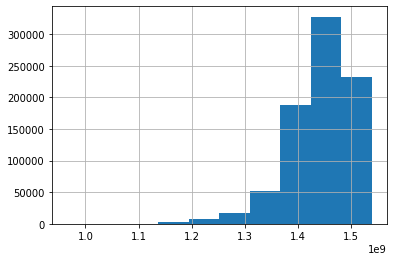

In [37]:
eda.column_info_hist('unixReviewTime')

**Summary**  
1. Распределение не нормальное, есть рейтинги очень старые, которые возможно не актуальны
2. Рассчитаем age review в днях

In [38]:
df['review_date'] = pd.to_datetime(df['unixReviewTime'],unit='s')
df['review_age'] = df['review_date'].max() - df['review_date']
df['review_age'] = (df['review_age'] / np.timedelta64(1, 'D')).astype(int)

df = df.drop(['unixReviewTime', 'review_date'], axis=1)
df['review_age']

0          728
1          550
2          570
3          867
4          867
          ... 
826890     521
826891      32
826892    1072
826893    1302
826894     323
Name: review_age, Length: 826895, dtype: int32

In [39]:
eda = EDA(df,'data')
eda.outlier_info('review_age')

COLUMN: review_age 
25%: 614.0.
75%: 1458.0.
IQR: 844.0.
Outlier ranges: [-652.0, 2724.0].
Outlier count: 25515 from 826895 (3%).




**Summary**  
1. Присутствует 3% выбросов

####  Column: asin

In [41]:
eda.column_info('asin')

Количество пропусков: 0,
count         826895
unique         41302
top       B00BUKL666
freq            5430
Name: asin, dtype: object,
Распределение:
B00BUKL666    5430
B00D3M2QP4    4733
B008QMX2SG    4611
B00R7PWK7W    2449
B000F4DKAI    2166
              ... 
B00BMUCNMU       1
B000O6IBQ0       1
B001EQ55X6       1
B005CJUXOM       1
B019YHTJ56       1
Name: asin, Length: 41302, dtype: int64,


**Summary**  
1. Amazon Standard Identification Number - идентификатор продуктов в Amazon.

####  Column: reviewerName

In [42]:
eda.column_info('reviewerName')

Количество пропусков: 164,
count              826731
unique             101207
top       Amazon Customer
freq                30612
Name: reviewerName, dtype: object,
Распределение:
Amazon Customer     30612
Kindle Customer      6012
Linda                 713
John                  695
David                 597
                    ...  
graphic designer        1
Cheryl az               1
Hinami (Claire)         1
Because                 1
rivkaf                  1
Name: reviewerName, Length: 101207, dtype: int64,


In [43]:
# проверим соответствие между reviewerName и userid
df[df['reviewerName'] == 'Amazon Customer']['userid'].value_counts()

7477      88
1330      55
24035     54
8027      52
15752     44
          ..
108108     1
115807     1
40378      1
73486      1
122137     1
Name: userid, Length: 5329, dtype: int64

In [44]:
def cat_reviewer_name(x):
    if x == 'Amazon Customer': 
        return 'Amazon'
    if x == 'Kindle Customer': 
        return 'Kindle'
    
    return 'Other'      

# Заменим значения в столбце на категории
df['reviewerName'] = df['reviewerName'].apply(lambda x: cat_reviewer_name(x))

df['reviewerName'].value_counts()

Other     790271
Amazon     30612
Kindle      6012
Name: reviewerName, dtype: int64

####  Column: style

In [45]:
eda.column_info('style')

Количество пропусков: 398698,
count                      428197
unique                      25892
top       {'Size:': ' Pack of 1'}
freq                         4549
Name: style, dtype: object,
Распределение:
{'Size:': ' Pack of 1'}                                  4549
{'Package Quantity:': ' 1'}                              4461
{'Package Type:': ' Standard Packaging'}                 3860
{'Size:': ' 1 Pack'}                                     3688
{'Size:': ' 24 Count'}                                   3615
                                                         ... 
{'Size:': ' 1 oz (Sampler - 15 Cups)'}                      1
{'Size:': ' 3 oz (Large - 40 Cuups)'}                       1
{'Size:': ' 12 Ounce', 'Flavor:': ' Maple Cranberry'}       1
{'Size:': ' 12 Ounce', 'Flavor:': ' Banana Walnut'}         1
{'Size:': ' 7 Pound', 'Flavor:': ' Original Creole'}        1
Name: style, Length: 25892, dtype: int64,


**Summary**  
1. Большое количество пропусков
2. Данные структурированы, но сложно выявить их взаимосвязть Style с другими признаками, удаляем.

In [46]:
df = df.drop(['style'], axis=1)

#### Column: userid

Количество пропусков: 0,
count    826895.000000
mean      54701.934150
std       37025.730023
min           0.000000
25%       21885.000000
50%       49887.000000
75%       85681.500000
max      127495.000000
Name: userid, dtype: float64,
Распределение:
842       418
17987     311
355       294
2024      288
2809      263
         ... 
125907      1
50115       1
118465      1
39486       1
36635       1
Name: userid, Length: 127448, dtype: int64,


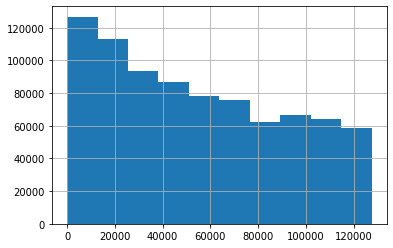

In [47]:
eda.column_info_hist('userid')

**Summary**  
1. Нету пропусков
2. Числовой признак.

#### Column: itemid

Количество пропусков: 0,
count    826895.000000
mean      17489.814649
std       11434.716969
min           0.000000
25%        7191.000000
50%       16573.000000
75%       26937.000000
max       41319.000000
Name: itemid, dtype: float64,
Распределение:
22208    5430
23540    4733
24556    4611
32046    2449
1919     2166
         ... 
21977       1
38542       1
39156       1
15582       1
36432       1
Name: itemid, Length: 41302, dtype: int64,


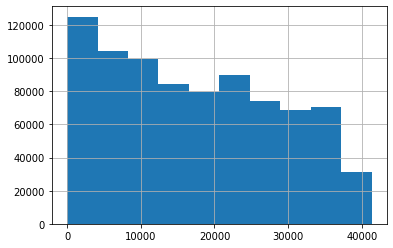

In [49]:
eda.column_info_hist('itemid')

In [50]:
#Проверим соответствие между itemid и ASIN
df.groupby(by=["asin"]).itemid.nunique()

asin
4639725043    1
4639725183    1
5463213682    1
9742356831    1
B00004S1C5    1
             ..
B01HJ2OFYI    1
B01HJ4FWGG    1
B01HJ7QPKU    1
B01HJCUNOO    1
B01HJF6FRA    1
Name: itemid, Length: 41302, dtype: int64

In [51]:
df.asin.nunique()

41302

In [52]:
#удалим asin так как есть itemid
df = df.drop(['asin'], axis=1)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 826895 entries, 0 to 826894
Data columns (total 21 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   overall       826895 non-null  float64
 1   verified      826895 non-null  int32  
 2   reviewerName  826895 non-null  object 
 3   reviewText    826621 non-null  object 
 4   summary       826729 non-null  object 
 5   vote          113951 non-null  object 
 6   userid        826895 non-null  int64  
 7   itemid        826895 non-null  int64  
 8   rating        826895 non-null  float64
 9   category      826895 non-null  object 
 10  description   756221 non-null  object 
 11  title         826895 non-null  object 
 12  brand         820834 non-null  object 
 13  rank          792722 non-null  object 
 14  also_view     443790 non-null  object 
 15  main_cat      825942 non-null  object 
 16  price         576335 non-null  object 
 17  also_buy      707795 non-null  object 
 18  deta

**Summary**  
1. Нету пропусков
2. Числовой признак.
3. В тренировочном датасете есть пропущенные **itemid**. Это может быть проблемой при предсказании с LightFM c item_features.

####  Column: overall

Количество пропусков: 0,
count    826895.000000
mean          4.440251
std           1.065334
min           1.000000
25%           4.000000
50%           5.000000
75%           5.000000
max           5.000000
Name: overall, dtype: float64,
Распределение:
5.0    592278
4.0    109334
3.0     58488
1.0     36159
2.0     30636
Name: overall, dtype: int64,


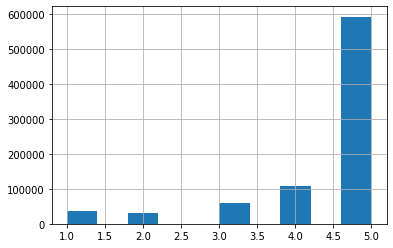

In [53]:
eda.column_info_hist('overall')

**Summary**  
1. Отсутствуют пропуски
2. Оценка по пятибальной шкале, большинство оценок 5
3. Отсутствует в тестовом dataset
4. Можно внести в числовые признаки

#### Columns: reviewText, summary

In [54]:
df.sample(3)

,overall,verified,reviewerName,reviewText,summary,vote,userid,itemid,rating,category,...,title,brand,rank,also_view,main_cat,price,also_buy,details,image,review_age
87195,5.0,1,Other,QUALITY COCOA. LOVE IT. SUPER RICH FLAVOR.,SUPER RICH FLAVOR. LOVE IT.,NaN,52271,28523,1.0,"[Grocery & Gourmet Food, Cooking & Baking, Bak...",...,"Healthworks Cacao Powder Organic, 2lb",Healthworks,"4,016inGroceryGourmetFood(",NaN,Grocery,$19.99,"[B003L1AP14, B00BSD9C5M, B004EKHMXU, B00BPX4OP...","\n\n\n\n\n\n <div class=""disclaim"">Flavor: ...",[https://images-na.ssl-images-amazon.com/image...,1371
560280,1.0,0,Other,I bought these at Costco. Coconut is my favori...,Too processed and artificial,4,107494,18479,0.0,"[Grocery & Gourmet Food, Produce, Packaged Pro...",...,"Philippine Brand Dried Young Coconut Snacks, 1...",Philippine,"13,931inGroceryGourmetFood(",NaN,Grocery,$23.99,"[B000Q5NSAS, B00GGBM49M, B017KR07LW, B00CCS8Y5...","\n\n\n\n\n\n <div class=""disclaim"">Size: <s...",[https://images-na.ssl-images-amazon.com/image...,1744
379472,5.0,1,Other,These are really nice for right before I do my...,"Go Raw Spirulina Energy Bar, 14 gram Bars, 10 ...",NaN,40309,3594,1.0,"[Grocery & Gourmet Food, Breakfast Foods, Brea...",...,"Go Raw Organic Sprouted Superfood Bars, Pumpki...",Go Raw,"39,953inGroceryGourmetFood(","[B0046HCDMG, B0027YVUWO, B01N01SEHO, B0027YUMR...",Grocery,$51.47,"[B0027YVV00, B0027YVV8M, B01N01SEHO, B0027YVUO...","\n\n\n\n\n\n <div class=""disclaim"">Size: <s...",[https://images-na.ssl-images-amazon.com/image...,1703


In [55]:
eda.column_info('reviewText')

Количество пропусков: 274,
count     826621
unique    686739
top         good
freq        3019
Name: reviewText, dtype: object,
Распределение:
good                                                                                                                                                                                                                                                                                                                             3019
great                                                                                                                                                                                                                                                                                                                            2525
Great                                                                                                                                                                                                        

In [56]:
eda.column_info('summary')

Количество пропусков: 166,
count         826729
unique        411451
top       Five Stars
freq          167416
Name: summary, dtype: object,
Распределение:
Five Stars                                          167416
Four Stars                                           26010
Three Stars                                          11682
One Star                                              5206
Two Stars                                             4824
                                                     ...  
Vegan and 24 grams of protein!                           1
Best plant-based protein powder.                         1
Great with water or with unsweetened almond milk         1
I like the taste and the fact that it is vegan           1
Wonderfully mild flavor                                  1
Name: summary, Length: 411451, dtype: int64,


**Summary**  
1. Есть пропуски в обоих колонках **reviewText**, **summary**.
2. Составим словарь слов для группировке отзывов и создадим на их основе новый признак как часть Future Engeneering.

In [57]:
df['reviewText'] = df['reviewText'].fillna(' ')
df['reviewText'] = df['reviewText'].astype(str)

In [58]:
from collections import Counter
Counter(" ".join(df["reviewText"].str.lower()).split()).most_common(100)

[('the', 1198978),
 ('i', 1053828),
 ('and', 905784),
 ('a', 853295),
 ('to', 673002),
 ('it', 554605),
 ('of', 541596),
 ('is', 517957),
 ('this', 490371),
 ('for', 397897),
 ('in', 397501),
 ('my', 306000),
 ('but', 274244),
 ('that', 255029),
 ('with', 246238),
 ('not', 245564),
 ('are', 235653),
 ('have', 224752),
 ('you', 218255),
 ('as', 213521),
 ('like', 197435),
 ('was', 184110),
 ('good', 183356),
 ('they', 182301),
 ('these', 181718),
 ('so', 177221),
 ('great', 175179),
 ('on', 174733),
 ('very', 150636),
 ('love', 140595),
 ('or', 130651),
 ('just', 128696),
 ('taste', 128227),
 ('be', 123408),
 ('if', 109793),
 ('at', 108820),
 ("it's", 106204),
 ('one', 100181),
 ('will', 99630),
 ('them', 99174),
 ('flavor', 92846),
 ('all', 91753),
 ('from', 90767),
 ('can', 88640),
 ('use', 85929),
 ('than', 85927),
 ('when', 85120),
 ('more', 84603),
 ('has', 81867),
 ('really', 79278),
 ('coffee', 78463),
 ('tea', 76915),
 ('would', 75173),
 ('we', 74350),
 ('some', 73988),
 ('no', 

In [59]:
good_list = ['good','great','love','best','perfect','yummy','enjoy', 'amazing','awesome']
bad_list = ['awful','bad','disappoint','aweful','waste','gross','poor','terrible']

In [60]:
def cat_review_text(x, good_words, bad_words):
    words = x.lower().split()
    pos = len(set.intersection(set(words), set(good_words)))
    neg = len(set.intersection(set(words), set(bad_words)))
    return pos + -1*neg
                    
df['review_reputation'] = df['reviewText'].apply(lambda x: cat_review_text(x,good_list,bad_list))
df['review_reputation'].sample(5)

745727    0
495644    2
603916    1
95900    -1
91630     1
Name: review_reputation, dtype: int64

In [61]:
df = df.drop(['summary', 'reviewText'], axis=1)

####  Columns: category & main_cat

In [62]:
eda.column_info('category')

Количество пропусков: 0,
count                                                826895
unique                                                 1107
top       [Grocery & Gourmet Food, Beverages, Coffee, Te...
freq                                                  54472
Name: category, dtype: object,
Распределение:
[Grocery & Gourmet Food, Beverages, Coffee, Tea & Cocoa, Coffee, Single-Serve Capsules & Pods]    54472
[Grocery & Gourmet Food, Beverages, Coffee, Tea & Cocoa, Tea, Green]                              17486
[Grocery & Gourmet Food, Snack Foods, Bars, Nut Bars]                                             15472
[Grocery & Gourmet Food, Candy & Chocolate, Candy & Chocolate Bars]                               15083
[Grocery & Gourmet Food, Beverages, Coffee, Tea & Cocoa, Coffee, Roasted Coffee Beans]            14304
                                                                                                  ...  
[Grocery & Gourmet Food, Produce, Fresh Vegetables, Peppers]     

**Summary**  
1. Нету пропусков

In [63]:
categories = df['category'].explode().value_counts()
categories

Grocery & Gourmet Food    826895
Beverages                 219589
Coffee, Tea & Cocoa       170635
Cooking & Baking          159829
Snack Foods               104515
                           ...  
Marshmallow                    3
Sofrito Sauce                  3
Havarti                        3
Tulips                         2
Tomatillos                     2
Name: category, Length: 1003, dtype: int64

In [64]:
df.shape

(826895, 20)

In [65]:
df.sample()

,overall,verified,reviewerName,vote,userid,itemid,rating,category,description,title,brand,rank,also_view,main_cat,price,also_buy,details,image,review_age,review_reputation
290096,5.0,1,Amazon,NaN,10909,37854,1.0,"[Grocery & Gourmet Food, Beverages, Coffee, Te...",NaN,"Rooibos Tea, USDA Certified Organic Tea, MY RE...",MY RED TEA,"1,142inGroceryGourmetFood(",NaN,Grocery,$19.99,"[B07DC4DZQT, B00F2GW4J2, B014Z2GJHG, B078KPH65...","\n\n\n\n\n\n <div class=""disclaim"">Size: <s...",NaN,116,1


In [66]:
# Grocery & Gourmet Food присутствует в каждой записи, удалим ее
categories = categories[1:]

In [67]:
categories

Beverages              219589
Coffee, Tea & Cocoa    170635
Cooking & Baking       159829
Snack Foods            104515
Coffee                  88012
                        ...  
Marshmallow                 3
Sofrito Sauce               3
Havarti                     3
Tulips                      2
Tomatillos                  2
Name: category, Length: 1002, dtype: int64

In [68]:
def get_top_category(x):
    for element in x:
        if element in categories:
            category = element
            break
        else:
            category = 'Other'
    return category

df['category'] = df['category'].apply( lambda x: get_top_category(x))

In [69]:
df['category'].value_counts()

Beverages                             219589
Cooking & Baking                      159829
Snack Foods                           104515
Candy & Chocolate                      87556
Herbs, Spices & Seasonings             53107
Breakfast Foods                        39037
Canned, Jarred & Packaged Foods        30254
Produce                                19335
Soups, Stocks & Broths                 16090
Jams, Jellies & Sweet Spreads          15148
Sauces, Gravies & Marinades            15050
Dairy, Cheese & Eggs                   11158
Dried Beans, Grains & Rice             10415
Pasta & Noodles                         8663
Condiments & Salad Dressings            8266
Food & Beverage Gifts                   7520
Breads & Bakery                         6598
Meat & Seafood                          4410
Frozen                                  3155
Olives, Pickles & Relishes              2687
Fresh Flowers & Live Indoor Plants      2224
Prepared Foods                           976
Meat Subst

In [70]:
df['main_cat'].value_counts()

Grocery                      783219
Health & Personal Care        31222
Amazon Home                    6843
All Beauty                     1457
Sports & Outdoors              1110
Industrial & Scientific         902
Office Products                 631
Toys & Games                    303
Pet Supplies                    125
Tools & Home Improvement         53
Baby                             33
Arts, Crafts & Sewing            19
Home Audio & Theater              9
Camera & Photo                    8
Software                          3
Musical Instruments               3
Cell Phones & Accessories         2
Name: main_cat, dtype: int64

In [71]:
# Записей с Grocery подавляющее большинство, приведем к бинарному типу
df['main_cat'] = df['main_cat'].apply(lambda x: 1 if x == 'Grocery' else 0).astype(int)
df['main_cat'].value_counts()

1    783219
0     43676
Name: main_cat, dtype: int64

#### Columns: decription & title

In [72]:
df[['description', 'title']].sample(10)

,description,title
747978,"[The pros know that when it comes to coffee, t...","Califia Farms Concentrated Cold Brew Coffee, B..."
120536,[Make snack time more fun with the Keebler Elv...,"Keebler Fudge Stripes Cookies Minis, Original,..."
362444,NaN,Clif Bar Lemon Zest Luna Bar
379594,[Distinctive and savory with an aroma full of ...,"Lipton Pyramid Tea Bags, Spiced Cinnamon Chai,..."
193832,"[Bonne Maman Mini - Strawberry, Apricot, Raspb...","Bonne Maman Assorted Preserves - Strawberry, A..."
268252,[Can't get enough butter on your popcorn? All ...,Popcorn Butter Topping - Buttery Flavor 7.75oz...
536455,[Celerbration Herbals bring you the Pure Quali...,CELEBRATION HERBALS Passion Flower Tea Organic...
355236,[This Hawaiian Sea Salt is great in any recipe...,Hawaiian Sea Salt From the Hawaiian Islands - ...
469571,NaN,Walkers Cheese and Onion Crisps 12 Bags
234950,"[""A long time ago, in the small European villa...","Werther's Original Hard Candy, Caramel Sugar F..."


In [73]:
df['description'] = df['description'].fillna(' ')
df['description'] = df['description'].astype(str)

Counter(" ".join(df["description"].str.lower()).split()).most_common(100)

[('and', 4392693),
 ('the', 3732110),
 ('to', 2667093),
 ('or', 2216310),
 ('of', 2154274),
 ('a', 2014954),
 ('not', 1774733),
 ('in', 1518965),
 ('are', 1378525),
 ('is', 1283854),
 ('with', 1100442),
 ('for', 1067836),
 ('by', 1016976),
 ('have', 981058),
 ('any', 898956),
 ('been', 865401),
 ('health', 795002),
 ('intended', 780534),
 ('prevent', 759956),
 ('treat,', 754839),
 ('dietary', 751933),
 ('diagnose,', 750632),
 ('evaluated', 750465),
 ('cure,', 729344),
 ('supplements', 721687),
 ('regarding', 721123),
 ('disease', 720760),
 ('fda', 711389),
 ("'statements", 710589),
 ("condition.']", 706526),
 ('that', 649007),
 ('you', 631535),
 ('our', 629610),
 ('from', 508709),
 ('your', 498009),
 ('as', 489293),
 ('on', 468603),
 ('this', 466633),
 ('we', 442735),
 ('it', 426005),
 ('organic', 425276),
 ('natural', 348685),
 ('product', 347151),
 ('tea', 318735),
 ('its', 265583),
 ('has', 255510),
 ('all', 255338),
 ('an', 253583),
 ('may', 250555),
 ('coffee', 245140),
 ('can', 2

In [74]:
# не понятно как можно использовать, удалим
df = df.drop(['description'], axis=1)

In [75]:
df['title'] = df['title'].fillna(' ')
df['title'] = df['title'].astype(str)

Counter(" ".join(df["title"].str.lower()).split()).most_common(100)

[('{', 2231814),
 ('}', 2215154),
 ('=', 1818129),
 ('var', 813734),
 ('in', 426852),
 ('&&', 389972),
 ('function', 367664),
 ('if', 366231),
 ('0', 343705),
 ('of', 321379),
 ('===', 318634),
 ('display:', 293971),
 ('-', 280660),
 (':', 263605),
 ('solid', 251712),
 ('.ap_body', 251000),
 ('(pack', 229119),
 ('.ap_header', 225900),
 ('.ap_footer', 225900),
 ('background-image:', 223122),
 ('background-repeat:', 223122),
 ('});', 220086),
 ('+', 201135),
 ('?', 197299),
 ('(window.amazonuipagejs', 197241),
 ('amazonuipagejs', 197241),
 ('return', 195830),
 ('1;', 187008),
 ('ounce', 179716),
 ('no-repeat;', 173385),
 ('||', 172545),
 ('color:', 172459),
 ('if(typeof', 172459),
 ('1px', 165879),
 ('0;', 148551),
 ('.tag-cols', 147822),
 ('==', 147822),
 ('};', 146556),
 ('p', 124114),
 ('padding:', 123914),
 ('date();', 123730),
 ('&', 123653),
 ('font-size:', 123185),
 ('white-space:', 123185),
 ('nowrap;', 123185),
 ('none;', 123185),
 ('background:', 123185),
 ('//', 123185),
 ('fa

In [76]:
#coдержит CSS стили, не понятно как использовать, удалим
df = df.drop(['title'], axis=1)

In [77]:
eda = EDA(df, 'data')

#### Column: brand

In [78]:
eda.column_info('brand')

Количество пропусков: 6061,
count     820834
unique      8866
top         KIND
freq       22506
Name: brand, dtype: object,
Распределение:
KIND                              22506
Bob's Red Mill                    12953
Planters                          10383
Twinings                           9056
Green Mountain Coffee Roasters     6791
                                  ...  
Factory Card and Party Outlet         1
WAFU                                  1
LOU'S BONSAI  NURSERY                 1
Righteously Raw                       1
Genesis Today                         1
Name: brand, Length: 8866, dtype: int64,


In [79]:
#заполним пропуски
df['brand'] = df['brand'].fillna('no_brand')

In [80]:
df['brand'].value_counts()

KIND                              22506
Bob's Red Mill                    12953
Planters                          10383
Twinings                           9056
Green Mountain Coffee Roasters     6791
                                  ...  
Novus Tea                             1
White Post Farm                       1
EASTSHORE                             1
Caffe Vita                            1
Genesis Today                         1
Name: brand, Length: 8867, dtype: int64

In [81]:
# большое количество разных брендов, удалим
df = df.drop(['brand'], axis=1)

#### Column: rank

In [82]:
eda.column_info('rank')

Количество пропусков: 34173,
count                      792722
unique                      36878
top       18inGroceryGourmetFood(
freq                         7421
Name: rank, dtype: object,
Распределение:
18inGroceryGourmetFood(         7421
4,575inGroceryGourmetFood(      4733
2,949inGroceryGourmetFood(      4611
72inGroceryGourmetFood(         2449
19,796inGroceryGourmetFood(     2166
                                ... 
330,416inGroceryGourmetFood(       1
78,319inGroceryGourmetFood(        1
70,646inGroceryGourmetFood(        1
377,792inGroceryGourmetFood(       1
43,444inGroceryGourmetFood(        1
Name: rank, Length: 36878, dtype: int64,


In [83]:
#очистим rank чтобы получить число
df['rank'] = df['rank'].astype(str).apply(lambda x: re.findall("\d+,\d+", x))

def get_rank(x):
    if len(x)>=1:
        to_return = int(x[0].replace(',',''))
    else:
        to_return = None
    return to_return

df['rank'] = df['rank'].apply(lambda x: get_rank(x))

In [84]:
df['rank'].isna().value_counts()

False    740005
True      86890
Name: rank, dtype: int64

In [85]:
#заполним пропуски медианным значением
df['rank'] = df['rank'].fillna(df['rank'].median())

<AxesSubplot:>

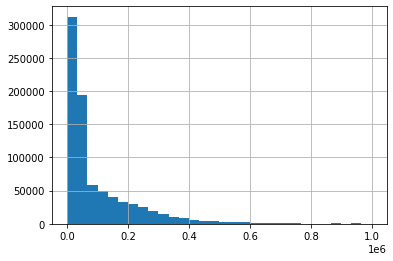

In [86]:
df['rank'].hist(bins=30)

In [87]:
# попробуем нормализовать с помощью логарифмирования
df['rank'] = np.log(df['rank']+1)

<AxesSubplot:>

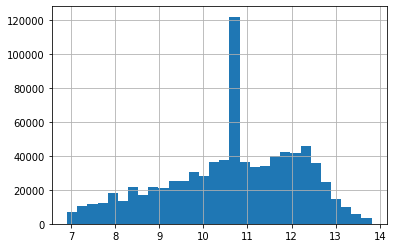

In [88]:
df['rank'].hist(bins=30)

###### Column: price

In [89]:
eda.column_info('price')

Количество пропусков: 250560,
count     576335
unique      4601
top       $14.99
freq       14110
Name: price, dtype: object,
Распределение:
$14.99              14110
$13.67              10660
$19.99               8920
$14.79               5632
$15.53               5561
                    ...  
$49.06                  2
$44.14                  1
$19.99 - $295.00        1
$6.93                   1
$35.16                  1
Name: price, Length: 4601, dtype: int64,


**Summary**  
1. Много пропусков, заменим их на среднюю цену

In [90]:
df[df['price'].str.contains("-") == True]['price'].value_counts()

$8.34 - $249.88     598
$15.49 - $40.84     330
$8.98 - $59.01      179
$21.00 - $192.46    168
$15.01 - $146.02    154
                   ... 
$38.99 - $360.00      6
$12.40 - $119.00      5
$54.99 - $815.63      4
$21.19 - $219.30      4
$19.99 - $295.00      1
Name: price, Length: 74, dtype: int64

In [91]:
#приведем price к числу
df['price'] = df['price'].astype('str').apply(lambda x: x.replace('$', ''))
df['price'] = df['price'].apply(lambda x: re.findall("\d+.\d+", x))

def get_price(x):
    if len(x) >= 1:
        to_return = float(x[0])
        if to_return == 0:
            to_return = float(x[0]+x[1])/2
    else:
        to_return = None
    return to_return

df['price'] = df['price'].apply(lambda x: get_price(x))

In [92]:
# заменим null на медианное значение
df['price'].fillna(df['price'].median(),inplace=True)

In [130]:
eda = EDA(df,'data')
eda.outlier_info('price')

COLUMN: price 
25%: 13.99.
75%: 21.5.
IQR: 7.51.
Outlier ranges: [2.7249999999999996, 32.765].
Outlier count: 84705 from 826895 (10%).




Выбросов достаточно много 

###### Columns: also_view, also_buy

In [95]:
df[["also_view","also_buy"]].sample(10)

,also_view,also_buy
652743,"[B00124VRPU, B003IGBTLW, B01ASX155C, B00JG64UA...","[B00124VRPU, B00124TUTK, B07HS1J45R, B0019AC50..."
74266,"[B0793421NP, B007PUOT64, B0040ED766, B07GPWF1S...","[B0793421NP, B0013NHT48, B07GPWF1SF, B007PUOT6..."
122161,NaN,"[B072KQWFFP, B00G6RK1NM, B00PPKSZO8, B01N9DCPB..."
333083,"[B00ARABK20, B00UW0B106, B00KYHMWWS, B01ITRUWP...","[B00ARABK20, B01ITRUWP8, B01ITRVWBQ, B00SLMZHT..."
804849,"[B00XK4N8VG, B00KQ15XGE, B001M0ALII, B000RYDKR...",NaN
219396,"[B0047Z0T14, B01M3X9L3Y, B00OTRMNIW, B000I6626...","[B000I62E6O, B000I612BM, B00OTSVEZY, B000I645S..."
109413,"[B007RC6J72, B002OVMO5M, B00UASFEFI, B00NALVQW...","[B00UASFEPS, B0766F7B8R, B078J65L6B, B002OVMO5..."
697301,NaN,"[B00DBETL5M, B0001M10YW, B0061FYWKC, B0777M814..."
266678,"[B005CUM0J2, B00CWAC3JC, B00AZX0IE0, B00JX9FL7...","[B005CUM0J2, B00CWAC3JC, B000LKXFMO, B005MIWPG..."
32331,NaN,"[B018LJZUGK, B01G8BJAJQ, B019FWQWEQ, B00W7A2YU..."


In [96]:
#заменим null пустыми массивами
df['also_view'].fillna('[]',inplace=True)
df['also_buy'].fillna('[]',inplace=True)

In [97]:
#посчитаем количество элементов в каждом поле
df['also_view_num'] = df['also_view'].apply(lambda x: len(x))
df['also_buy_num'] = df['also_buy'].apply(lambda x: len(x))

In [98]:
df = df.drop(['also_view','also_buy'], axis=1)

###### Column: details

In [99]:
df['details'].sample(10)

401510    \n\n\n\n\n\n    <div class="disclaim">Size: <s...
53435     \n\n\n\n\n\n    <div class="disclaim">Flavor: ...
2158      \n\n\n\n\n\n    <div class="disclaim">Flavor: ...
6597      \n\n\n\n\n\n    <div class="disclaim">Flavor: ...
460255    \n      <div class="content">\n\n\n\n\n\n\n<ul...
259095    \n      <div class="content">\n\n\n\n\n\n\n<ul...
313849    \n      <div class="content">\n\n\n\n\n\n\n<ul...
800567    \n      <div class="content">\n\n\n\n\n\n\n<ul...
407699                                                  NaN
300253    \n      <div class="content">\n\n\n\n\n\n\n<ul...
Name: details, dtype: object

In [100]:
#очень грязные данные, удалим
df = df.drop(['details'], axis=1)

###### Column: image

In [101]:
df['image'].isna().value_counts()

False    738256
True      88639
Name: image, dtype: int64

In [102]:
#преобразуем с бинарному типу, есть картинка или нет
df['image'] = df['image'].fillna(0)
df['image']= df['image'].apply(lambda x: 0 if x== 0 else 1).astype(int)

In [103]:
df['image'].value_counts()

1    738256
0     88639
Name: image, dtype: int64

###### Column: vote

In [104]:
df['vote'].value_counts()

2      42820
3      21447
4      12337
5       7932
6       5480
       ...  
387        1
857        1
402        1
414        1
153        1
Name: vote, Length: 311, dtype: int64

In [105]:
#заполним пропуски со значением 1, считая что если есть отзыв то есть оценка
df['vote'] = df['vote'].fillna(1)

In [113]:
df['vote'] = df['vote'].astype('str').apply(lambda x: x.replace(',', ''))

In [114]:
df['vote'] = df['vote'].astype(int)

### Summary

1. Удалены дубликаты
2. Обработаны пропуски
3. Удалены некоторые поля, не предоставляющие необходимой информации для поставленной задачи.
4. Выполнена некоторая базовая трансформация для дальнейшей Future Engeneering

### 3.5. Future Engeneering

In [119]:
df.columns

Index(['overall', 'verified', 'reviewerName', 'vote', 'userid', 'itemid',
       'rating', 'category', 'rank', 'main_cat', 'price', 'image',
       'review_age', 'review_reputation', 'price_type', 'also_view_num',
       'also_buy_num', 'vote_type'],
      dtype='object')

#### Добавим новые признаки
Добавим-ка количество отзывов, оставленное пользователем и популярность товара.    
Популярность товара подходит для **холодного старта** - можно предложить пользователю некоторые товары с хорошими оценками из списка наиболее популярных.

In [120]:
user_activity_dict = df['userid'].value_counts().to_dict()
df['reviews_by_user'] = df['userid'].map(user_activity_dict)

item_popularity_dict = df['itemid'].value_counts().to_dict()
df['reviews_of_item'] = df['itemid'].map(item_popularity_dict)

del user_activity_dict, item_popularity_dict

Добавим среднюю и медианные цены по категориям

In [121]:
mean_price_dict = df.groupby('category').mean().to_dict()['price']
median_price_dict = df.groupby('category').median().to_dict()['price']

df['category_mean_price'] = df['category'].map(mean_price_dict)
df['category_median_price'] = df['category'].map(median_price_dict)

Добавим средний overall по item

In [122]:
overall_dict = df.groupby('itemid').mean().to_dict()['overall']
df['mean_overall_item'] = df['itemid'].map(overall_dict)

Cделаем категории по price и vote

In [123]:
# сделаем категории по цене
df["price_type"] = df["price"].apply(lambda x: 'low' if x < 10 else 'high' if x > 20 else 'middle')

In [124]:
# сделаем категории по vote
eda = EDA(df, "data")
eda.outlier_info('vote')
df["vote_type"] = df["vote"].apply(lambda x: 'low' if x == 1 else 'high' if x > 50 else 'middle')

df["vote_type"].value_counts()

COLUMN: vote 
25%: 1.0.
75%: 1.0.
IQR: 0.0.
Outlier ranges: [1.0, 1.0].
Outlier count: 113951 from 826895 (14%).




low       712944
middle    112531
high        1420
Name: vote_type, dtype: int64

#### Преобразуем категориальные значения

In [125]:
# преобразование с помощью LabelEncoder()
label_encoder = LabelEncoder()

In [126]:
df['category'] = label_encoder.fit_transform(df['category'])

In [127]:
df['reviewerName'] = label_encoder.fit_transform(df['reviewerName'])

#### Cформируем dummy переменные

In [132]:
price_dummies = pd.get_dummies(df['price_type'], prefix = df['price_type'].name)
df = df.join(price_dummies)

In [133]:
vote_dummies = pd.get_dummies(df['vote_type'], prefix = df['vote_type'].name)
df = df.join(vote_dummies)

In [135]:
df = df.drop(['price', 'price_type', 'vote', 'vote_type'], axis=1)

#### Проанализируем Train dataset

In [136]:
df.sample(5)

,overall,verified,reviewerName,userid,itemid,rating,category,rank,main_cat,image,...,reviews_of_item,category_mean_price,category_median_price,mean_overall_item,price_type_high,price_type_low,price_type_middle,vote_type_high,vote_type_low,vote_type_middle
663763,5.0,0,2,70134,27980,1.0,17,10.803669,1,1,...,5,20.352255,16.98,3.600000,0,0,1,0,1,0
82749,5.0,1,1,6904,2056,1.0,7,9.746951,1,1,...,488,19.317897,16.98,4.635246,1,0,0,0,1,0
761699,2.0,0,2,30150,35121,0.0,7,11.896602,1,1,...,11,19.317897,16.98,4.000000,1,0,0,0,1,0
148586,5.0,1,2,11165,7372,1.0,23,11.817819,1,1,...,428,18.972584,16.98,4.226636,1,0,0,0,1,0
615662,5.0,1,2,92705,7857,1.0,1,12.772928,1,1,...,6,20.913164,16.98,5.000000,0,0,1,0,1,0


In [137]:
df.columns

Index(['overall', 'verified', 'reviewerName', 'userid', 'itemid', 'rating',
       'category', 'rank', 'main_cat', 'image', 'review_age',
       'review_reputation', 'also_view_num', 'also_buy_num', 'reviews_by_user',
       'reviews_of_item', 'category_mean_price', 'category_median_price',
       'mean_overall_item', 'price_type_high', 'price_type_low',
       'price_type_middle', 'vote_type_high', 'vote_type_low',
       'vote_type_middle'],
      dtype='object')

Сформируем Pandas Profiling Report 

In [141]:
eda = EDA(df, 'data train')
eda.primary_analysis()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [139]:
# удалим колонки, с большой кореляцией
df = df.drop(['overall', 'rank', 'category'], axis=1)

In [434]:
df.columns

Index(['verified', 'reviewerName', 'vote', 'userid', 'itemid', 'rating',
       'main_cat', 'price', 'image', 'review_age', 'review_reputation',
       'also_view_num', 'also_buy_num', 'reviews_by_user', 'reviews_of_item',
       'category_mean_price', 'category_median_price', 'mean_overall_item'],
      dtype='object')

In [163]:
bin_cols = ['verified','image', 'main_cat', 'price_type_high', 'price_type_middle', 'price_type_low']
num_cols = ['review_age', 'review_reputation', 
            'reviews_by_user', 'reviews_of_item', 'category_mean_price','category_median_price', 'mean_overall_item']

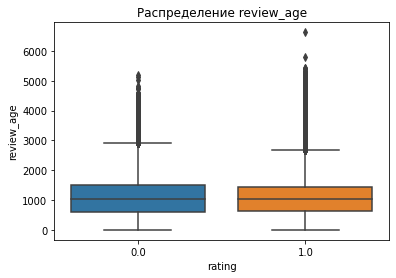

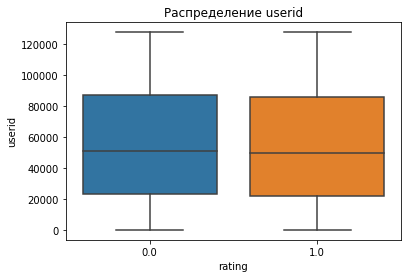

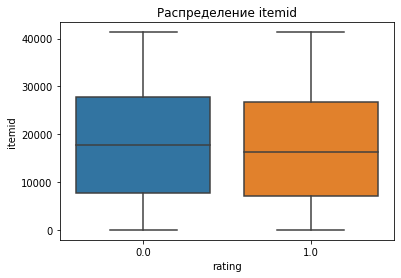

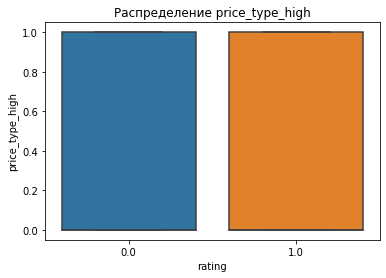

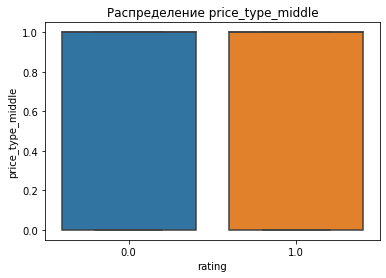

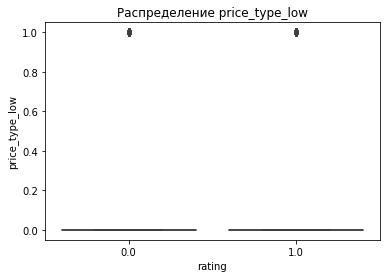

In [164]:
# для получения большей информации стоит построить боксплоты зависимостей от overall или рейтинга
for col in ['review_age', 'userid', 'itemid', 'price_type_high', 'price_type_middle', 'price_type_low']:
    plt.title(f"Распределение {col}")
    sns.boxplot(x='rating', y=col, data=df)
    plt.show()

<AxesSubplot:>

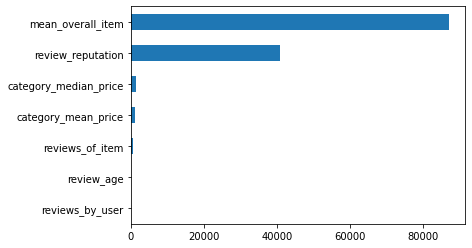

In [165]:
from sklearn.feature_selection import f_classif, mutual_info_classif

imp_num = pd.Series(f_classif(df[num_cols], df['rating'])[0], index = num_cols)

imp_num.sort_values(inplace = True)
imp_num.plot(kind = 'barh')

<AxesSubplot:>

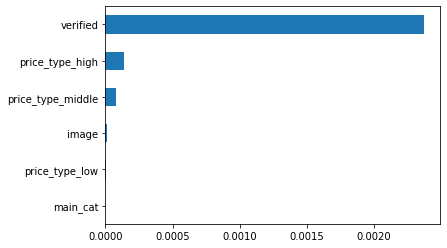

In [166]:
imp_cat = pd.Series(mutual_info_classif(df[bin_cols], 
                                     df['rating'], 
                                     discrete_features =True), index = bin_cols)

imp_cat.sort_values(inplace = True)
imp_cat.plot(kind = 'barh')

<AxesSubplot:>

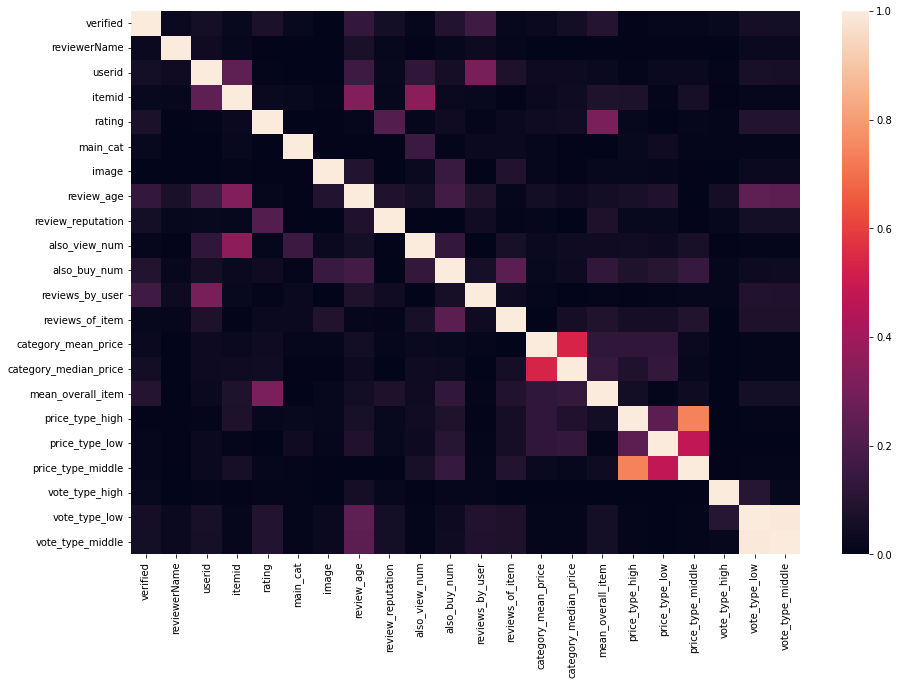

In [167]:
import seaborn as sns

plt.subplots(figsize=(15,10))
sns.heatmap(df.corr().abs(), vmin=0, vmax=1)

In [439]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
df[num_cols] = pd.DataFrame(scaler.fit_transform(df[num_cols]))

In [168]:
eda.outlier_info('review_age')

COLUMN: review_age 
25%: 614.0.
75%: 1458.0.
IQR: 844.0.
Outlier ranges: [-652.0, 2724.0].
Outlier count: 25515 from 826895 (3%).




In [169]:
df["review_age"] = df["review_age"].apply(lambda x: 'new' if x < 10 else 'old' if x > 100 else 'neutral')

In [170]:
review_age_dummies = pd.get_dummies(df['review_age'], prefix = df['review_age'].name)
df = df.join(review_age_dummies)

In [171]:
df = df.drop(['review_age'], axis=1)

In [172]:
df.sample(10)

,verified,reviewerName,userid,itemid,rating,main_cat,image,review_reputation,also_view_num,also_buy_num,...,mean_overall_item,price_type_high,price_type_low,price_type_middle,vote_type_high,vote_type_low,vote_type_middle,review_age_neutral,review_age_new,review_age_old
105215,1,2,21818,838,1.0,1,1,0,42,30,...,4.279915,1,0,0,0,1,0,0,0,1
353825,1,2,54894,2295,1.0,1,1,1,50,99,...,4.673684,1,0,0,0,1,0,0,0,1
781562,1,2,61548,29289,0.0,1,0,0,2,93,...,3.142857,0,0,1,0,0,1,0,0,1
15913,1,2,105810,10534,0.0,1,0,0,54,74,...,4.227273,0,0,1,0,1,0,0,0,1
37779,1,2,89016,6218,1.0,1,1,0,42,93,...,4.506403,0,0,1,0,1,0,0,0,1
392149,1,2,61993,15093,1.0,1,1,0,2,93,...,4.420118,1,0,0,0,1,0,0,0,1
45129,1,2,21984,9256,1.0,1,1,0,2,67,...,4.816206,0,1,0,0,1,0,0,0,1
215039,0,2,54858,38299,0.0,1,1,0,51,20,...,4.300578,0,0,1,0,1,0,0,0,1
496396,1,2,103273,9794,1.0,1,1,1,46,86,...,4.680000,0,0,1,0,1,0,0,0,1
64766,1,2,116363,24556,1.0,1,1,1,2,95,...,4.580785,0,0,1,0,1,0,0,0,1


In [173]:
eda = EDA(df, 'data train')
eda.primary_analysis()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 4 Обучаем модель

In [174]:
NUM_THREADS = 4 #число потоков
NUM_COMPONENTS = 30 #число параметров вектора 
NUM_EPOCHS = 20  #число эпох обучения
RANDOM_STATE = 32

In [175]:
df['rating'] = df['rating'].apply(lambda x: 1 if x == 1 else -1)

df['rating'].value_counts()

 1    701612
-1    125283
Name: rating, dtype: int64

In [176]:
train_data, test_data = train_test_split(df,random_state=RANDOM_STATE, shuffle=True)

In [177]:
ratings_coo = sparse.coo_matrix((train_data['rating'].astype(int),
                                 (train_data['userid'],
                                  train_data['itemid'])))

In [178]:
model = LightFM(learning_rate=0.1, loss='logistic', no_components=NUM_COMPONENTS, random_state=RANDOM_STATE)
model = model.fit(ratings_coo, epochs=NUM_EPOCHS, num_threads=NUM_THREADS)

In [179]:
#Получаем предсказание:
preds = model.predict(test_data.userid.values, test_data.itemid.values)

In [180]:
# Подсчитываем метрику roc_auc_score
sklearn.metrics.roc_auc_score(test_data.rating,preds)

0.7207580961731112

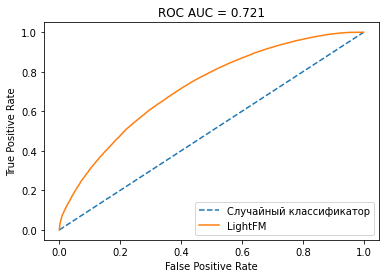

In [181]:
#Cтроим ROC AUС
roc_auc_curve(test_data.rating,preds)

In [182]:
normalized_preds = (preds - preds.min())/(preds - preds.min()).max()

In [191]:
preds.min(), preds.max(), normalized_preds.min(), normalized_preds.max()

(-21.356012, 34.333424, 0.0, 1.0)

**Summary:**  
На модели результаты RocAuc: **0.7207**  
Предложенный Future Engeneriing дал отрицательный вариант

### Прогоним модель полностью на train данных

In [192]:
ratings_coo = sparse.coo_matrix((df['rating'].astype(int),
                                 (df['userid'],
                                  df['itemid'])))

In [193]:
model = LightFM(learning_rate=0.1, loss='logistic', no_components=NUM_COMPONENTS, random_state=RANDOM_STATE)
model = model.fit(ratings_coo, epochs=NUM_EPOCHS, num_threads=NUM_THREADS)

In [194]:
#Получаем предсказание:
preds = model.predict(df.userid.values, df.itemid.values)

In [195]:
# Подсчитываем метрику roc_auc_score
sklearn.metrics.roc_auc_score(df.rating,preds)

0.999193013303179

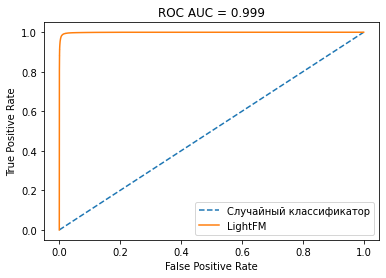

In [196]:
#Cтроим ROC AUС
roc_auc_curve(df.rating,preds)

In [197]:
normalized_preds = (preds - preds.min())/(preds - preds.min()).max()

In [198]:
preds.min(), preds.max(), normalized_preds.min(), normalized_preds.max()

(-34.809963, 37.312176, 0.0, 1.0)

**Summary:**  
На полной train модели результаты RocAuc очень высоки: **0.999**

### Прогоняем модель на тестовых данных

In [199]:
# Прогоняем на тестовых данных
preds_sub = model.predict(test.userid.values, test.itemid.values)

In [200]:
normalized_preds_sub = (preds_sub - preds_sub.min())/(preds_sub - preds_sub.min()).max()

In [201]:
preds_sub.min(), preds_sub.max(), normalized_preds_sub.min(), normalized_preds_sub.max()

(-26.844324, 36.500175, 0.0, 1.0)

In [202]:
df.columns

Index(['verified', 'reviewerName', 'userid', 'itemid', 'rating', 'main_cat',
       'image', 'review_reputation', 'also_view_num', 'also_buy_num',
       'reviews_by_user', 'reviews_of_item', 'category_mean_price',
       'category_median_price', 'mean_overall_item', 'price_type_high',
       'price_type_low', 'price_type_middle', 'vote_type_high',
       'vote_type_low', 'vote_type_middle', 'review_age_neutral',
       'review_age_new', 'review_age_old'],
      dtype='object')

In [215]:
#укажем в item_features признаки,описывающие товар и затем сделаем разреженную матрицу item_features для дальнейшего использования в модели
item_features = df[['main_cat','price_type_high','price_type_middle','price_type_low','image']]
norm_ifeatures = (item_features - item_features.mean()) / item_features.std()
item_features=(sparse.csr_matrix(norm_ifeatures)).astype(np.float32)

In [216]:
# сделаем разреженную матрицу user_features,содержащий признаки,описывающие потребителя
user_features = df[['verified', 'reviewerName', 'review_age_old', 'review_age_new', 'review_age_neutral', 'also_buy_num', 'also_view_num']]
norm_ufeatures = (user_features - user_features.mean()) / user_features.std()
user_features = (sparse.csr_matrix(norm_ufeatures)).astype(np.float32)

In [217]:
NUM_THREADS = 4 #число потоков
NUM_COMPONENTS = 30 #число параметров вектора 
NUM_EPOCHS = 20  #число эпох обучения
RANDOM_STATE = 32

model_feat = LightFM(learning_rate=0.1, loss='logistic', no_components=NUM_COMPONENTS)
model_feat = model_feat.fit(ratings_coo, user_features=user_features, item_features=item_features, epochs=NUM_EPOCHS,
                       num_threads=NUM_THREADS)

In [209]:
#для предсказаний используем матрицы 
userid = np.array(df.userid).astype(np.int32)
itemid =np.array(df.itemid).astype(np.int32) 

In [210]:
# Получаем предсказание
preds0 = model_feat.predict(userid, itemid, item_features=item_features, user_features=user_features,num_threads=NUM_THREADS)

In [212]:
# Подсчитываем метрику roc_auc_score
sklearn.metrics.roc_auc_score(df.rating,preds0)

0.5076125937907017

In [218]:
submission['rating'] = normalized_preds_sub
submission.sample(10)

,Id,rating
40932,40932,0.474676
24660,24660,0.505692
92332,92332,0.469242
62581,62581,0.466295
14216,14216,0.467868
68181,68181,0.443253
129189,129189,0.450993
150689,150689,0.452984
226055,226055,0.452070
263753,263753,0.441915


In [230]:
submission.to_csv('submission_log.csv', index=False)

In [220]:
# Достаём эбмеддинги
item_biases, item_embeddings = model.get_item_representations()

In [221]:
item_biases.shape, item_embeddings.shape

((41320,), (41320, 30))

Мы получили эмбеддинги. Эмбеддинги нам нужны, чтобы давать предсказание к каждому товару, а точнее искать наиболее похожие. Для быстрого поиска среди большого количества товаров будем использовать метод ближайших соседей, approximate k-nn, который реализован в библиотеке nmslib.

Вместо того, чтобы перебирать все вершины, мы можем очень быстро обходить граф.

In [222]:
!pip install nmslib

In [223]:
#Вспомогательная функция для поиска по графу
def nearest_item_nms(itemid, index, n=10):
    nn = index.knnQuery(item_embeddings[itemid], k=n)
    return nn

In [224]:
import nmslib
 
#Создаём наш граф для поиска
nms_idx = nmslib.init(method='hnsw', space='cosinesimil')
 
#Начинаем добавлять наши товары в граф
nms_idx.addDataPointBatch(item_embeddings)
nms_idx.createIndex(print_progress=True)

In [225]:
mapper = dict(zip(meta['asin'],meta['title']))

# Создадим dataframe prod_id
train['title'] = train.asin.apply(lambda x: mapper[x])
test['title'] = test.asin.apply(lambda x: mapper[x])
prod_id = train.drop(['verified','reviewTime','reviewerName','reviewText','summary','unixReviewTime','vote','style','image'],axis=1)

In [226]:
prod_id[prod_id.title.str.find('chocolate')>=0].head(5)

,overall,asin,userid,itemid,rating,title
7245,5.0,B00GXT7NJ8,6256,26561,1.0,Pernigotti Cocoa - 1 Kg (2.2 lbs) - from the f...
9687,4.0,B00OBO2GVM,28826,31074,1.0,Atkins endulge pieces - milk chocolate caramel...
11510,5.0,B0017OLEMQ,21565,6627,1.0,Sixlets 48 packs of candy coated chocolate candy
15346,5.0,B00069IHO6,20913,784,1.0,Milk Chocolate Rocks 3 pound bag (48 ounces of...
19385,5.0,B0017OLEMQ,35367,6627,1.0,Sixlets 48 packs of candy coated chocolate candy


In [228]:
# Ищем похожие товары
nbm = nearest_item_nms(11510,nms_idx)[0]

#Выведим их
prod_id[prod_id.itemid.isin(nbm)]

,overall,asin,userid,itemid,rating,title
12954,5.0,B00RI84A3A,23575,32121,1.0,Milton's Gluten Free Crispy Sea Salt Baked Cra...
21633,3.0,B000HEUIB0,85762,2632,0.0,"Jaw Busters Jaw Breakers, 1lb Bulk Bag by Swee..."
33614,5.0,B0055ZRUNK,76850,15256,1.0,Intelligentsia House Blend - 12oz - Light Roas...
46453,5.0,B000HEUIB0,50844,2632,1.0,"Jaw Busters Jaw Breakers, 1lb Bulk Bag by Swee..."
68147,2.0,B0055ZRUNK,15708,15256,0.0,Intelligentsia House Blend - 12oz - Light Roas...
...,...,...,...,...,...,...
819606,5.0,B0072HQG48,20226,18022,1.0,"Dole Cherry Mixed Fruit, 64 Ounce Total"
827486,5.0,B003CGHKKM,267,11510,1.0,Sanders Hot Fudge (Milk Chocolate Hot Fudge To...
830371,5.0,B00SRNF4C6,75350,32406,1.0,"Terrasoul Superfoods White Quinoa (Organic), 2..."
846177,5.0,B0072HQG48,89315,18022,1.0,"Dole Cherry Mixed Fruit, 64 Ounce Total"


**SUMMARY**  

В ходе проекта был подготовлен ряд последовательных моделей для оценки проекта с помощью метрики ROC AUC. 
Она характеризует точность предсказаний и должна быть устойчива к несбалансированным классам.

Был проведен EDA и Future Engenering. Изначально был расчитана метрика ROC AUC на простой модели, что задало точку отсчета. Следующим шагом было добавление данных из Meta, на котором модель обучалась – результат ROC AUC улучшился до показателя 0.999 при сабмите, что  заметно лучше базового решения (0.745). 

Следующим шагом стала работа с item_features и эмбедингами. С помощью user/item_features мы добавили наши фичи. Если мы используем user/item_features при обучении, то LifhtFM считает, что каждый пользователь и элемент характеризуются одной характеристикой, уникальной для этого пользователя (или элемента). Для быстрого поиска среди большого количества товаров использовали метод ближайших соседей, approximate k-nn, который реализован в библиотеке nmslib. К сожалению, данную модель показала значительно худшие результаты  ROC AUC близкие к 0.507.

Обоснование выбранной метрики.

В рамках целей и задач создания рекомендательной системы было определено, что рекомендательная система должна быть нацелена на увеличения прибыли онлайн магазина. Метрика ROC-AUC наиболее подходит для оценки точности прогнозирования рекомендуемых товаров для увеличения продаж. Графическое изображение ROC AUC обеспечивает графическое представление производительности рекомендательной системы. Она отображает True Positive rate против False Positive rate для увеличения размера набора рекомендаций. Oчевидной целью является максимизация площади под кривой. Таким образом, площадь под кривой AUC может использоваться в виде единственного показателя общего качества рекомендательной системы.